In [1]:
import os
import kaleido
import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import plotly.graph_objects as go
import plotly.express as px

from collections.abc import Callable
from IPython.display import display

pd.set_option('display.max_rows', 200)

In [2]:
def read_dataset_part(dataset_part: str):
    file_in_parts_pattern = os.path.join(path, f"results_{dataset_part}_part*.csv")
    part_files = sorted(glob.glob(file_in_parts_pattern))

    if part_files:
        print(f"Merging {len(part_files)} part files")
        df = pd.concat((pd.read_csv(f) for f in part_files), ignore_index=True)
    else:
        single_file = os.path.join(path, f"results_{dataset_part}.csv")
        df = pd.read_csv(single_file)

    return df

In [3]:
dataset_types = ["institutions", "institution_subnets", "ip_addresses_sample"]
metric_for_eval = "HARMONIC-SCORE"
column_subset = ["n_bytes", "n_flows", "n_packets"]

training_window_specific = 24
prediction_window_specific = 1

path = "../results/"

df_dict = {dt: read_dataset_part(dt) for dt in dataset_types}
models = list(df_dict["institutions"]["MODEL"].drop_duplicates())

Merging 2 part files


### Cut off for metrics

In [4]:
for key, df in df_dict.items():
    df["R2-SCORE"] = df["R2-SCORE"].apply(lambda x: -10 if x < -10 or x > 10 else x)
    df = df[~df["R2-SCORE"].isna()]
    df["RMSE"] = df["RMSE"].apply(lambda x: 11 if x > 11 else x)
    df["HARMONIC-SCORE"] = (2*(df["RMSE"]*abs(df["R2-SCORE"] - 1)))/(df["RMSE"]+abs(df["R2-SCORE"] - 1))
    df_dict[key] = df

/var/folders/t9/g7s70xk53qx9yhmljyq8s0n80000gn/T/ipykernel_56139/3153656645.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["RMSE"] = df["RMSE"].apply(lambda x: 11 if x > 11 else x)
/var/folders/t9/g7s70xk53qx9yhmljyq8s0n80000gn/T/ipykernel_56139/3153656645.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["HARMONIC-SCORE"] = (2*(df["RMSE"]*abs(df["R2-SCORE"] - 1)))/(df["RMSE"]+abs(df["R2-SCORE"] - 1))
/var/folders/t9/g7s70xk53qx9yhmljyq8s0n80000gn/T/ipykernel_56139/3153656645.py:4: SettingWithC

In [5]:
def do_for_all(df_dict: dict, func: Callable, *args, **kwargs):
    """
    Applies the given function `func` to every DataFrame in `df_dict`.
    Additional positional and keyword arguments can be passed through.
    
    Parameters
    ----------
    df_dict : dict
        Dictionary of DataFrames.
    func : callable
        A function that takes a DataFrame as the first argument.
    *args : tuple
        Any additional positional arguments for `func`.
    **kwargs : dict
        Any additional keyword arguments for `func`.
    
    Returns
    -------
    dict
        Dictionary of results, with the same keys as `df_dict`.
    """
    
    df_results = [] 
    for name, df in df_dict.items():
        result = func(df, *args, **kwargs)
        result = result.add_suffix(f"_{name}")
        df_results.append(result)
    combined_df = pd.concat(df_results, axis=1)
    display(combined_df)



### Compare models overall

In [6]:
do_for_all(
    df_dict,
    lambda df: df.groupby("MODEL")[[metric_for_eval]].mean()
)

,HARMONIC-SCORE_institutions,HARMONIC-SCORE_institution_subnets,HARMONIC-SCORE_ip_addresses_sample
MODEL,,,
ETSformer,0.157397,0.171246,0.204517
GRU,0.163990,0.186064,0.179893
GRU-FCN,0.176632,0.200411,0.191993
InceptionTime,0.355568,0.381399,0.476098
LSTM,0.167102,0.189958,0.180577
LSTM-FCN,0.186110,0.209400,0.189613
Mean,0.209133,0.214005,0.210392
RCLSTM,0.299553,0.320286,0.202089
ResNet,0.244087,0.267879,0.222720


In [7]:
do_for_all(
    df_dict,
    lambda df: df.groupby("MODEL")[["TRAINING_TIME"]].mean()
)

,TRAINING_TIME_institutions,TRAINING_TIME_institution_subnets,TRAINING_TIME_ip_addresses_sample
MODEL,,,
ETSformer,4260.598238,4161.916882,3920.511757
GRU,198.726094,207.421998,184.987735
GRU-FCN,59.951450,47.647888,41.164045
InceptionTime,116.434811,119.800044,128.217932
LSTM,206.213941,181.624616,165.759439
LSTM-FCN,124.104552,129.987721,123.347059
Mean,0.000000,0.000000,0.000000
RCLSTM,572.880699,414.603505,663.894882
ResNet,293.233541,278.677661,242.639232


### Compare training and prediction windows combinations

In [8]:
do_for_all(
    df_dict,
    lambda df: df.groupby(by=["TRAINING_WINDOW", "PREDICTION_WINDOW"])[[metric_for_eval]].mean()
)

HARMONIC-SCORE_institutions  \
TRAINING_WINDOW PREDICTION_WINDOW                                
24              1                                     0.134400   
                24                                    0.068168   
168             1                                     0.148427   
                24                                    0.270501   
                168                                   0.162027   
744             1                                     0.185136   
                168                                   0.349984   

                                   HARMONIC-SCORE_institution_subnets  \
TRAINING_WINDOW PREDICTION_WINDOW                                       
24              1                                            0.158522   
                24                                           0.080889   
168             1                                            0.171921   
                24                                           0.288399   
                168                                          0.173082   
744             1                                            0.206155   
                168                                          0.363912   

                                   HARMONIC-SCORE_ip_addresses_sample  
TRAINING_WINDOW PREDICTION_WINDOW                                      
24              1                                            0.172086  
                24                                           0.094157  
168             1                                            0.181951  
                24                                           0.280674  
                168                                          0.155198  
744             1                                            0.199164  
                168                                          0.308755

### Compare model, training and prediction windows combinations

In [9]:
do_for_all(
    df_dict,
    lambda df: df.groupby(by=["MODEL", "TRAINING_WINDOW", "PREDICTION_WINDOW"])[[metric_for_eval]].mean()
)

HARMONIC-SCORE_institutions  \
MODEL         TRAINING_WINDOW PREDICTION_WINDOW                                
ETSformer     24              1                                     0.119318   
              168             1                                     0.109858   
                              24                                    0.191058   
              744             1                                     0.109270   
                              168                                   0.257483   
GRU           24              1                                     0.119856   
              168             1                                     0.120737   
                              24                                    0.214776   
              744             1                                     0.122578   
                              168                                   0.242006   
GRU-FCN       24              1                                     0.120713   
              168             1                                     0.133667   
                              24                                    0.191320   
              744             1                                     0.187570   
                              168                                   0.249894   
InceptionTime 24              1                                     0.142771   
              168             1                                     0.187203   
                              24                                    0.593730   
              744             1                                     0.257345   
                              168                                   0.596793   
LSTM          24              1                                     0.123480   
              168             1                                     0.124441   
                              24                                    0.219906   
              744             1                                     0.126123   
                              168                                   0.241562   
LSTM-FCN      24              1                                     0.122851   
              168             1                                     0.137928   
                              24                                    0.210168   
              744             1                                     0.208988   
                              168                                   0.250539   
Mean          24              1                                     0.182636   
              168             1                                     0.204061   
                              24                                    0.208104   
              744             1                                     0.222020   
                              168                                   0.228845   
RCLSTM        24              1                                     0.142827   
              168             1                                     0.146757   
                              24                                    0.308156   
              744             1                                     0.133252   
                              168                                   0.765982   
ResNet        24              1                                     0.135395   
              168             1                                     0.171488   
                              24                                    0.297356   
              744             1                                     0.299540   
                              168                                   0.316655   
lstmae        24              24                                    0.068168   
              168             168                                   0.162027   

                                                 HARMONIC-SCORE_institution_subnets  \
MODEL         TRAINING_WINDOW PREDICTION_

### Compare metrics

In [10]:
do_for_all(
    df_dict,
    lambda df: df.groupby(by=["TS_METRIC"])[[metric_for_eval]].mean()
)

,HARMONIC-SCORE_institutions,HARMONIC-SCORE_institution_subnets,HARMONIC-SCORE_ip_addresses_sample
TS_METRIC,,,
average_n_dest_asn,0.199457,0.213143,0.209443
average_n_dest_ip,0.228074,0.236895,0.200060
average_n_dest_ports,0.173250,0.177771,0.220177
avg_duration,0.286045,0.311826,0.209867
avg_ttl,0.207928,0.241032,0.285584
dir_ratio_bytes,0.248650,0.261560,0.246826
dir_ratio_packets,0.238805,0.256168,0.252842
n_bytes,0.176921,0.209083,0.199343
n_flows,0.216390,0.226198,0.194492


### Compare models & attribute subset

In [11]:
df_dict_filt = {key: df[df["TS_METRIC"].isin(column_subset)] for key, df in df_dict.items()}

do_for_all(
    df_dict_filt,
    lambda df: df.groupby(by=["MODEL", "TS_METRIC"])[[metric_for_eval]].mean()
)

HARMONIC-SCORE_institutions  \
MODEL         TS_METRIC                                
ETSformer     n_bytes                       0.149038   
              n_flows                       0.159518   
              n_packets                     0.148875   
GRU           n_bytes                       0.138855   
              n_flows                       0.173112   
              n_packets                     0.142017   
GRU-FCN       n_bytes                       0.135149   
              n_flows                       0.181579   
              n_packets                     0.137060   
InceptionTime n_bytes                       0.435908   
              n_flows                       0.403373   
              n_packets                     0.428078   
LSTM          n_bytes                       0.139163   
              n_flows                       0.176786   
              n_packets                     0.142433   
LSTM-FCN      n_bytes                       0.136155   
              n_flows                       0.190594   
              n_packets                     0.140071   
Mean          n_bytes                       0.152457   
              n_flows                       0.216069   
              n_packets                     0.160973   
RCLSTM        n_bytes                       0.172126   
              n_flows                       0.220040   
              n_packets                     0.154335   
ResNet        n_bytes                       0.168622   
              n_flows                       0.264201   
              n_packets                     0.177647   
lstmae        n_bytes                       0.089169   
              n_flows                       0.122395   
              n_packets                     0.088774   

                         HARMONIC-SCORE_institution_subnets  \
MODEL         TS_METRIC                                       
ETSformer     n_bytes                              0.177296   
              n_flows                              0.162811   
              n_packets                            0.169837   
GRU           n_bytes                              0.170519   
              n_flows                              0.185912   
              n_packets                            0.168234   
GRU-FCN       n_bytes                              0.170659   
              n_flows                              0.192560   
              n_packets                            0.167683   
InceptionTime n_bytes                              0.465115   
              n_flows                              0.425972   
              n_packets                            0.456986   
LSTM          n_bytes                              0.170760   
              n_flows                              0.187756   
              n_packets                            0.169130   
LSTM-FCN      n_bytes                              0.170741   
              n_flows                              0.200148   
              n_packets                            0.169854   
Mean          n_bytes                              0.190206   
              n_flows                              0.213392   
              n_packets                            0.186029   
RCLSTM        n_bytes                              0.208410   
              n_flows                              0.239659   
              n_packets                            0.196216   
ResNet        n_bytes                              0.197176   
              n_flows                              0.267675   
              n_packets                            0.207300   
lstmae        n_bytes                              0.112469   
              n_flows                              0.127401   
              n_packets                            0.108066   

                         HARMONIC-SCORE_ip_addresses_sample  
MODEL         TS_METRIC                                      
ETSformer     n_bytes                              0.175934  
              n_flows        

In [12]:
do_for_all(
    df_dict_filt,
    lambda df: df.groupby(by=["MODEL", "TRAINING_WINDOW", "PREDICTION_WINDOW", "TS_METRIC"])[[metric_for_eval]].mean()
)

HARMONIC-SCORE_institutions  \
MODEL         TRAINING_WINDOW PREDICTION_WINDOW TS_METRIC                                
ETSformer     24              1                 n_bytes                       0.127158   
                                                n_flows                       0.115958   
                                                n_packets                     0.124814   
              168             1                 n_bytes                       0.121534   
                                                n_flows                       0.102299   
                                                n_packets                     0.117430   
                              24                n_bytes                       0.169633   
                                                n_flows                       0.211685   
                                                n_packets                     0.173424   
              744             1                 n_bytes                       0.121315   
                                                n_flows                       0.101847   
                                                n_packets                     0.117787   
                              168               n_bytes                       0.205548   
                                                n_flows                       0.265800   
                                                n_packets                     0.210920   
GRU           24              1                 n_bytes                       0.119878   
                                                n_flows                       0.119126   
                                                n_packets                     0.120693   
              168             1                 n_bytes                       0.122344   
                                                n_flows                       0.121351   
                                                n_packets                     0.123064   
                              24                n_bytes                       0.155917   
                                                n_flows                       0.239478   
                                                n_packets                     0.162807   
              744             1                 n_bytes                       0.124918   
                                                n_flows                       0.124166   
                                                n_packets                     0.123933   
                              168               n_bytes                       0.171218   
                                                n_flows                       0.261439   
                                                n_packets                     0.179589   
GRU-FCN       24              1                 n_bytes                       0.114758   
                                                n_flows                       0.118445   
                                                n_packets                     0.112542   
              168             1                 n_bytes                       0.117223   
                                                n_flows                       0.137133   
                                                n_packets                     0.116622   
                              24                n_bytes                       0.140762   
                                                n_flows                       0.210175   
                                                n_packets                     0.145597   
              744             1                 n_bytes                       0.131821   
                                                n_flows                       0.191135   
                                                n_packets                     0.137964   
                              168               n_bytes                       0.171181   
         

### KDEs of the selected combination

In [13]:
df_dict_2 = {key: df[(df['PREDICTION_WINDOW'] == prediction_window_specific) & (df['TRAINING_WINDOW'] == training_window_specific)] for key, df in df_dict.items()}

do_for_all(
    df_dict_2,
    lambda df: df.groupby(by=["MODEL"])[[metric_for_eval]].mean()
)

,HARMONIC-SCORE_institutions,HARMONIC-SCORE_institution_subnets,HARMONIC-SCORE_ip_addresses_sample
MODEL,,,
ETSformer,0.119318,0.129935,0.169849
GRU,0.119856,0.144010,0.161821
GRU-FCN,0.120713,0.147402,0.158952
InceptionTime,0.142771,0.175198,0.189512
LSTM,0.123480,0.149021,0.163260
LSTM-FCN,0.122851,0.149649,0.161149
Mean,0.182636,0.183512,0.200151
RCLSTM,0.142827,0.181071,0.171303
ResNet,0.135395,0.167020,0.170739


In [14]:
colormap = px.colors.qualitative.Plotly  # Predefined color sequence
identifier_to_color = {id_: colormap[i % len(colormap)] for i, id_ in enumerate(models)}
for subset, df_2 in df_dict_2.items():
    for column in column_subset:
    
        fig = go.Figure()
    
        mean_results = {}
        for model in models:
            tmp = df_2[(df_2['TS_METRIC'] == column) & (df_2['MODEL'] == model)]
            if tmp.shape[0] == 0:
                continue
            mean_results[model] = tmp[metric_for_eval].mean()
            
            
        for model in sorted(mean_results, key=lambda k: mean_results[k]):
            tmp = df_2[(df_2['TS_METRIC'] == column) & (df_2['MODEL'] == model)]
            tmp = tmp[~tmp[metric_for_eval].isna()]
            x_min = 0
            x_max = 0.5
            x_vals = np.linspace(x_min, x_max, 1000)
            if tmp.shape[0] == 0:
                continue
            
            kde = gaussian_kde(tmp[metric_for_eval].values)
            fig.add_trace(go.Scatter(
                    x=x_vals,
                    y=kde(x_vals),
                    mode='lines',
                    name=f"{model}",
                    marker=dict(color=identifier_to_color[model], size=10),
                ))
        fig.update_layout(
                title=column,
                xaxis_title=f'{metric_for_eval} - {subset}',
                yaxis_title='Density',
                template='plotly_white',
                showlegend=True,
                font=dict(size=18),
                height=450
            )
    
        # Show the plot
        fig.show()


In [15]:
mapping = {"institutions": "ins",
           "institution_subnets": "subs",
           "ip_addresses_sample": "ips"}

def plot_kdes(ts_metric):
    i = 0
    fig, axs = plt.subplots(len(models) - 1, len(df_dict_2), figsize=(24,24))
    for subset, df_2 in df_dict_2.items(): 
        j = 0
        for model in models:
            if model == "lstmae":
                continue
            data = df_2[(df_2["TS_METRIC"] == ts_metric) & (df_2["MODEL"] == model)][metric_for_eval]
            log_data = np.log1p(data)

            axs[j][i].hist(log_data, bins=50, edgecolor='black')
            axs[j][i].set_title(f"{model} - {ts_metric} - {mapping[subset]}", fontsize=18)
            axs[j][i].set_xlabel(metric_for_eval, fontsize=16)
            j += 1
        i += 1
            

    plt.tight_layout()
    plt.savefig('kdes.pdf')

### n_bytes - The number of bytes

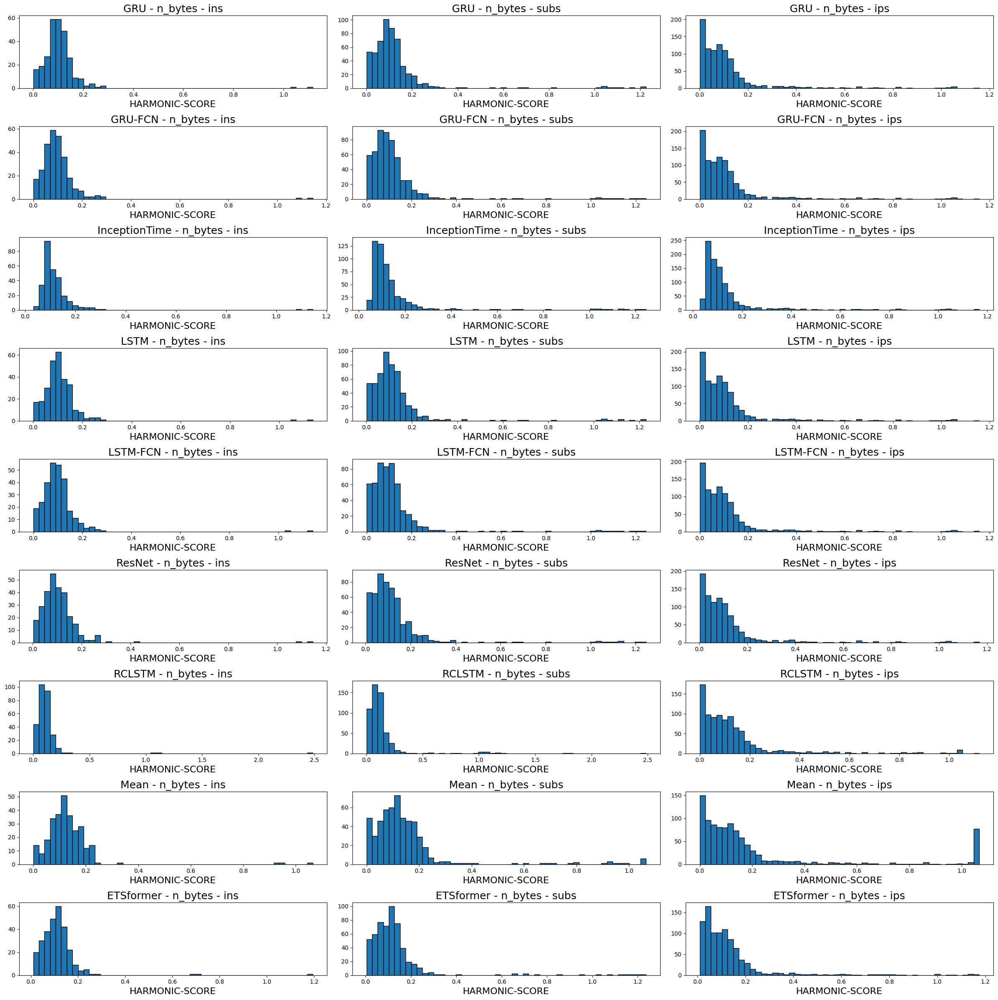

In [16]:
plot_kdes("n_bytes")

### n_flows - The number of flows

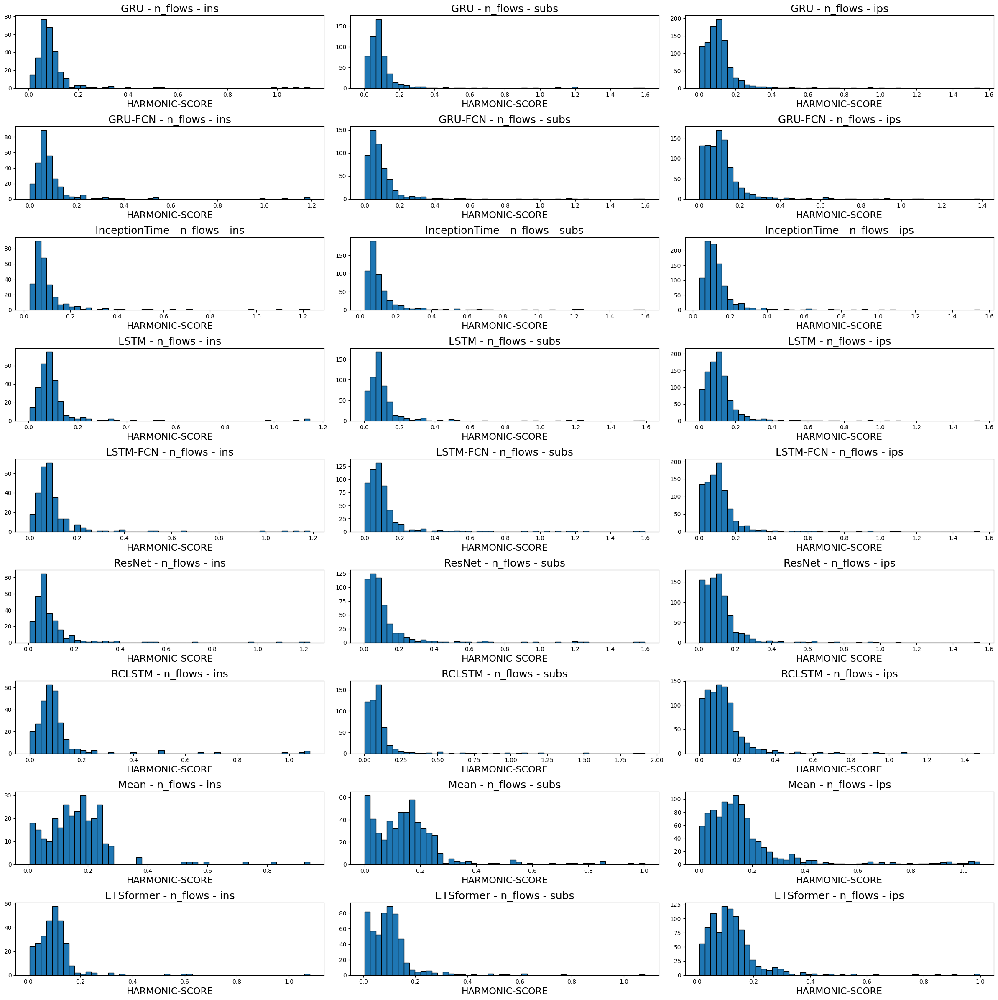

In [17]:
plot_kdes("n_flows")

### n_packets - The number of packets

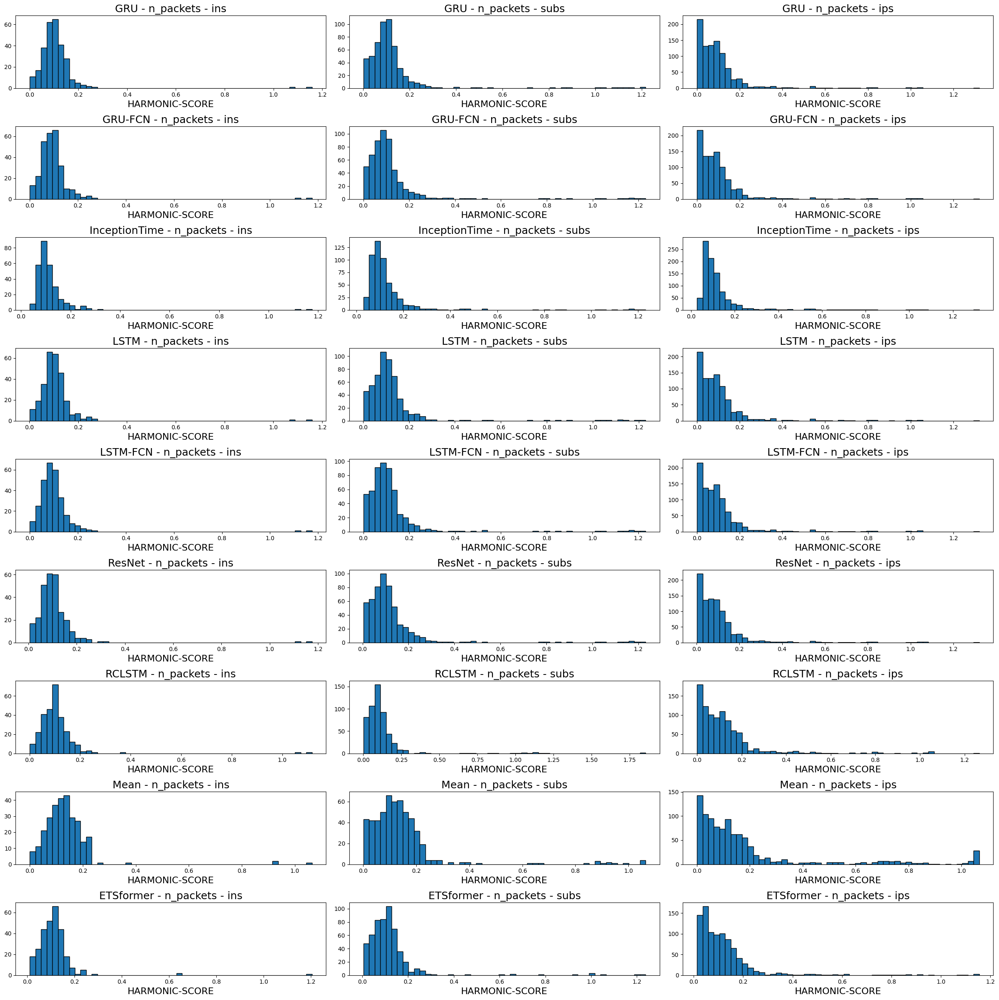

In [18]:
plot_kdes("n_packets")

### tcp_udp_ratio_packets - The TCP/UDP packet ratio

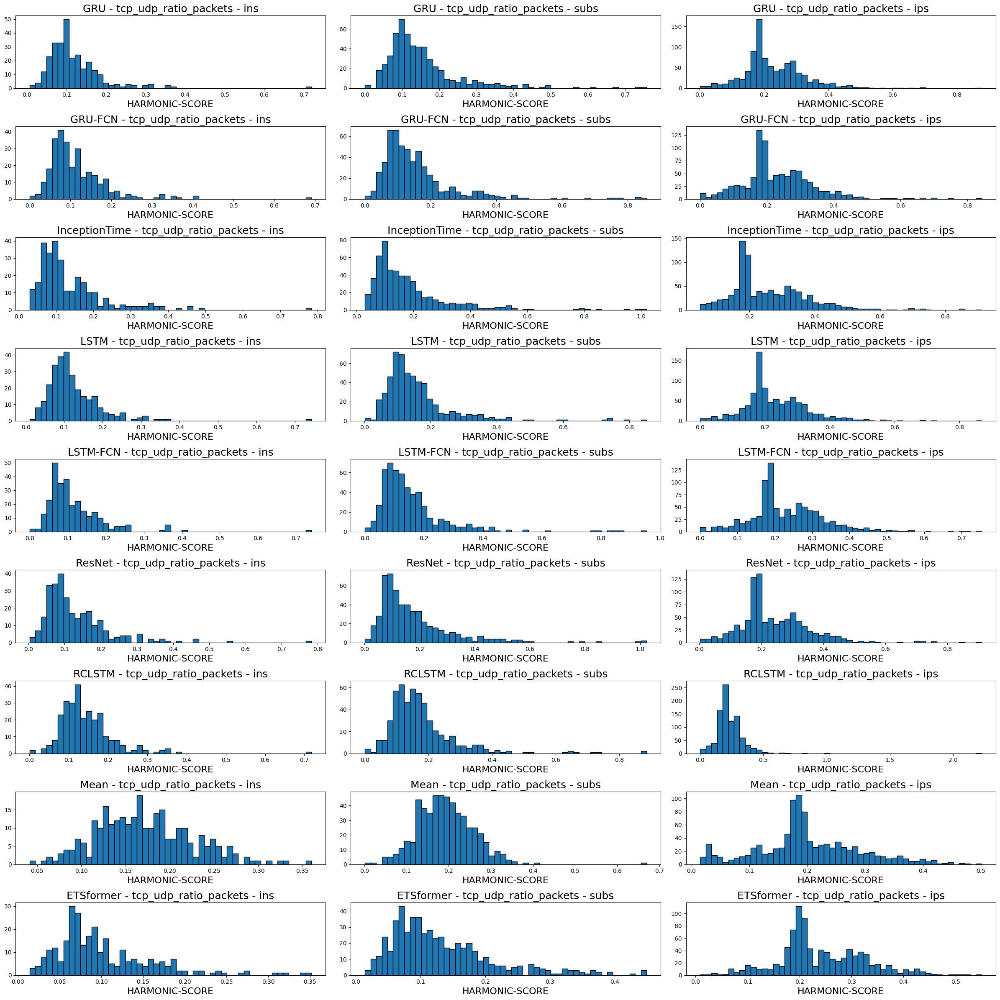

In [19]:
plot_kdes("tcp_udp_ratio_packets")

### tcp_udp_ratio_bytes - The TCP/UDP bytes ratio

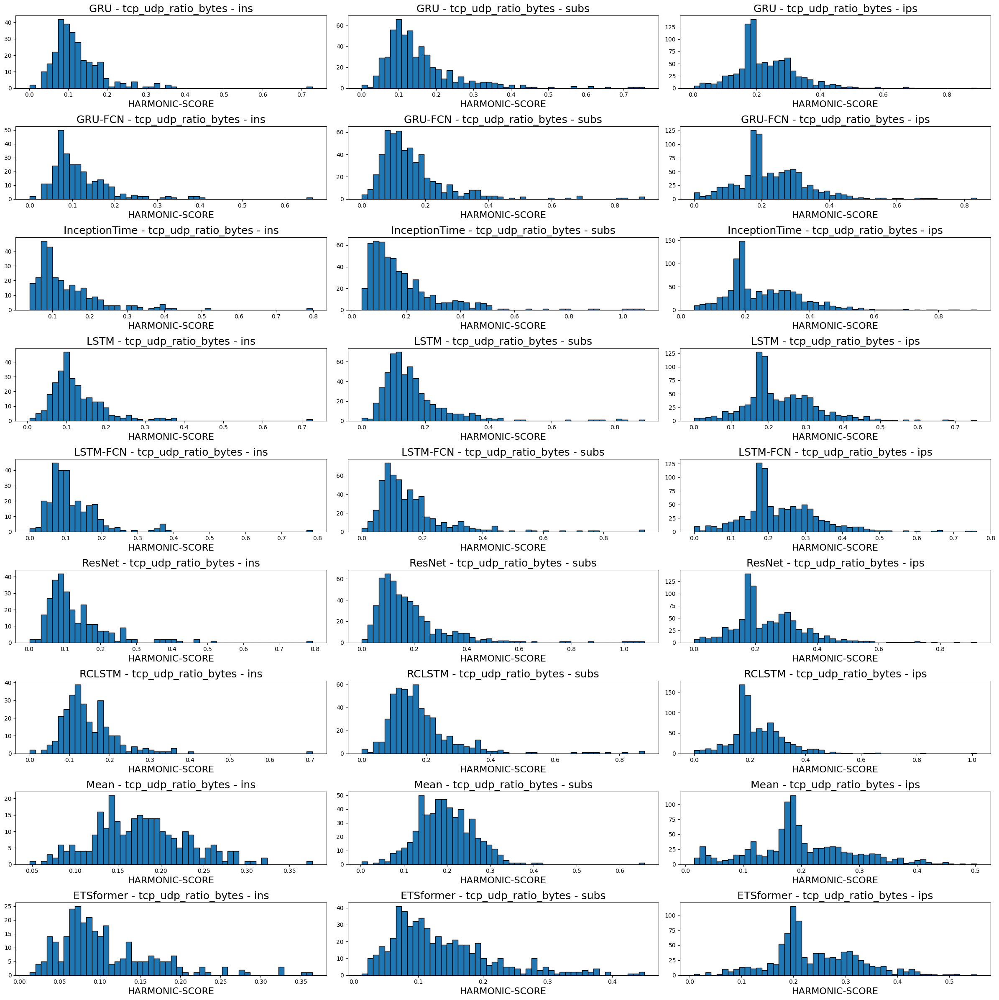

In [20]:
plot_kdes("tcp_udp_ratio_bytes")

### dir_ratio_packets - The directional ratio of packets

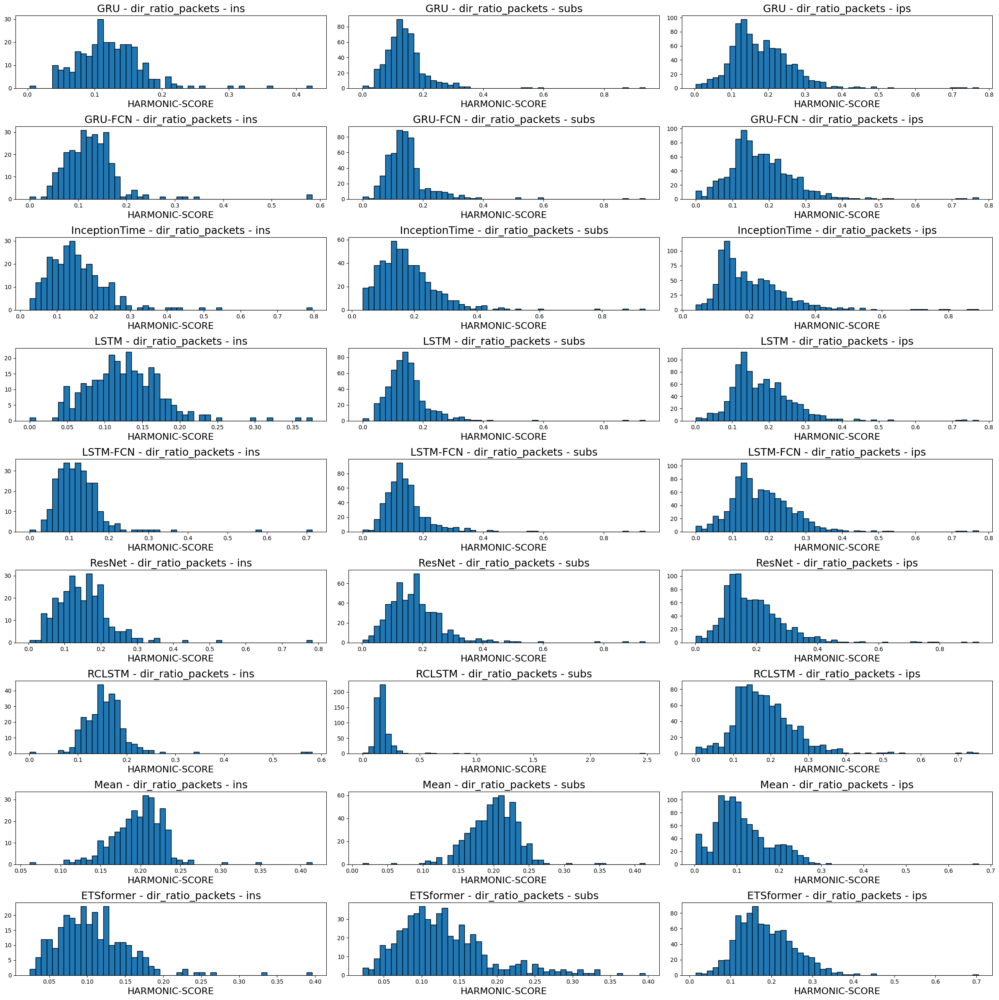

In [21]:
plot_kdes("dir_ratio_packets")

### dir_ratio_bytes - The directional ratio of bytes

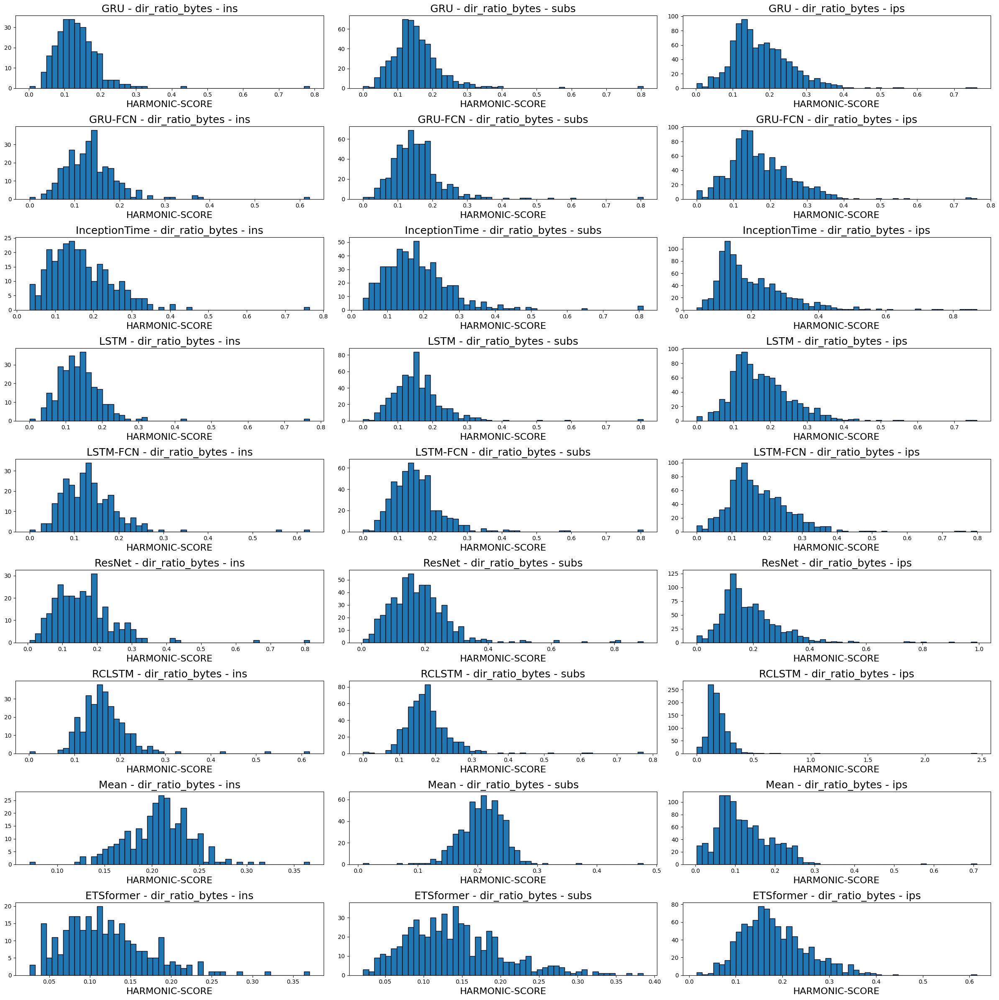

In [22]:
plot_kdes("dir_ratio_bytes")

### avg_ttl - The average TTL

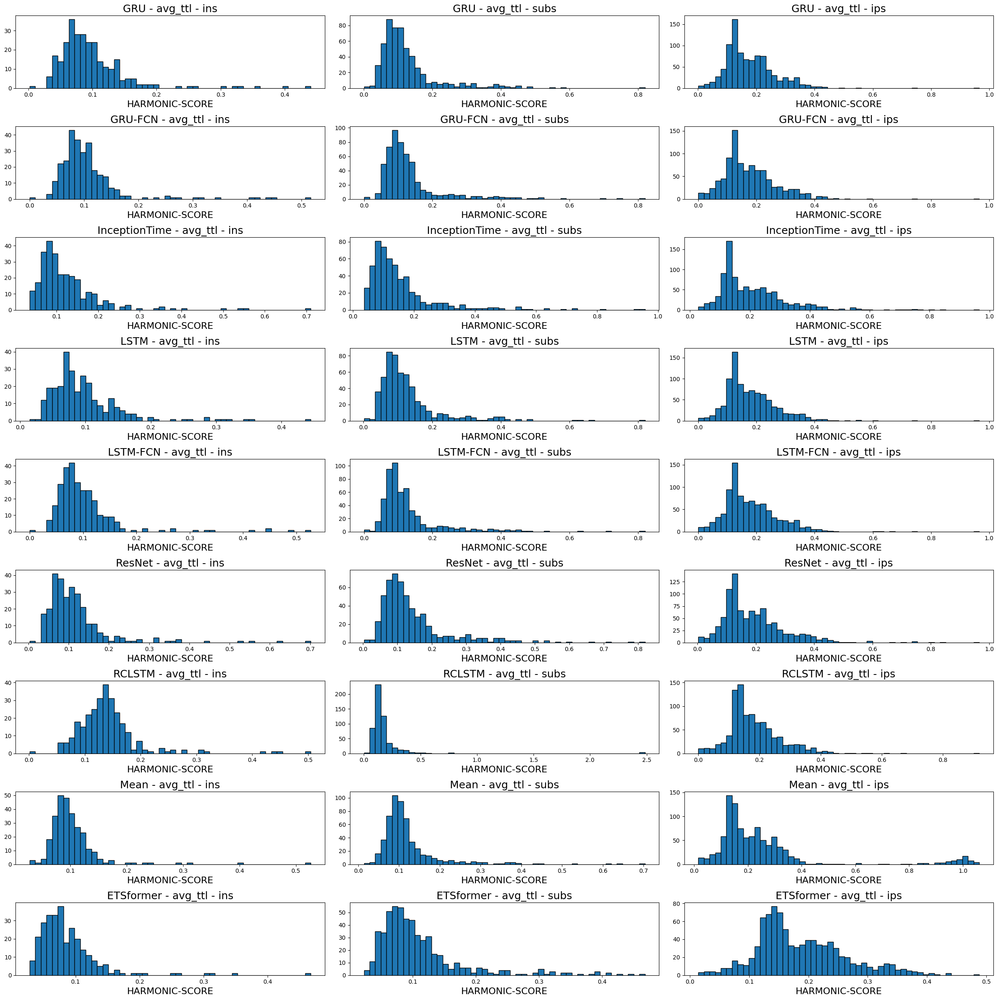

In [23]:
plot_kdes("avg_ttl")

### avg_duration - The average duration

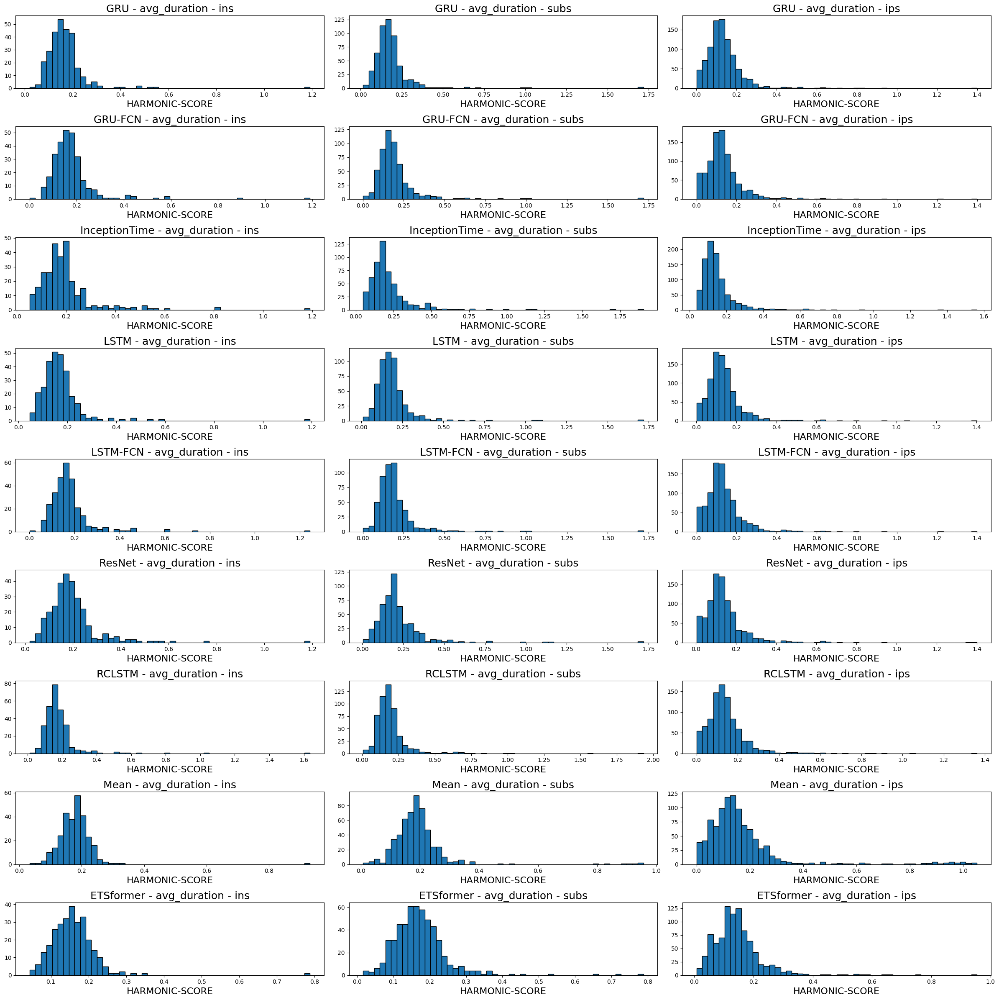

In [24]:
plot_kdes("avg_duration")

### average_n_dest_asn - Average of the number of unique destination ASNs

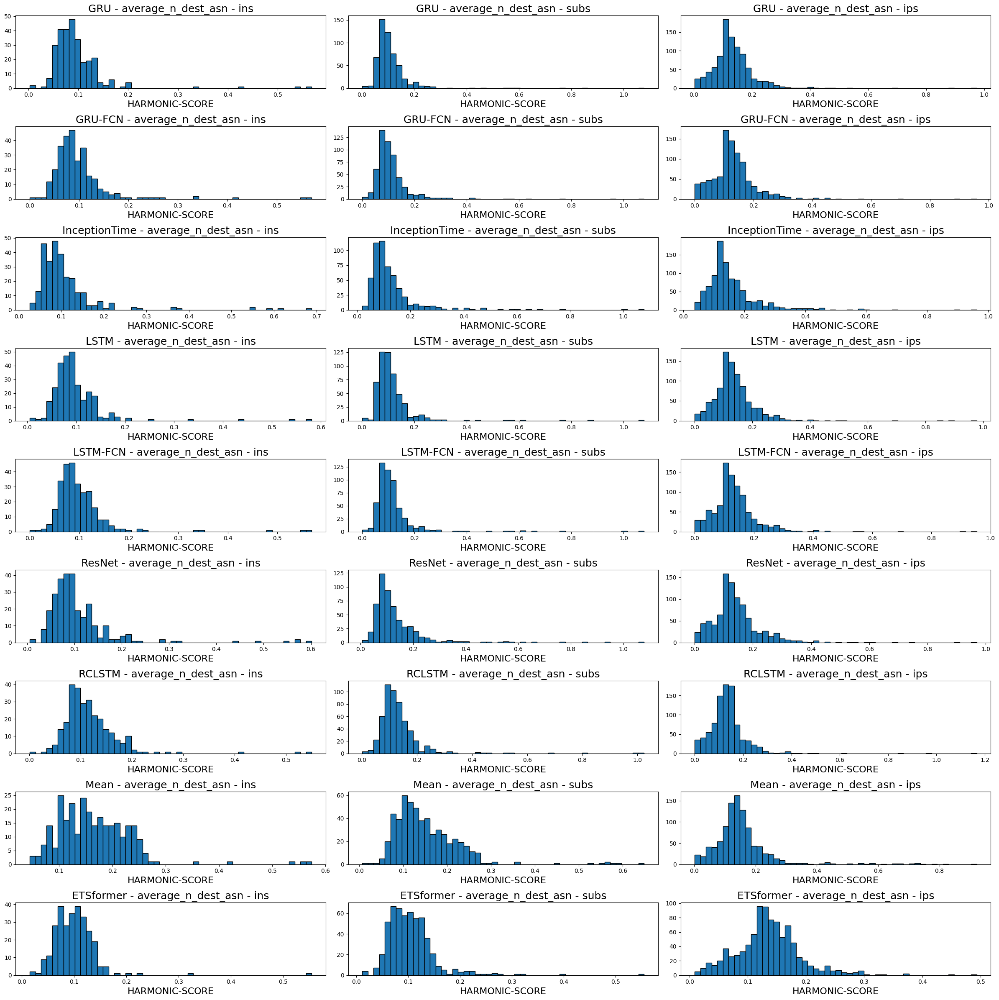

In [25]:
plot_kdes("average_n_dest_asn")

### average_n_dest_ip - Average of the number of unique destination ASNs

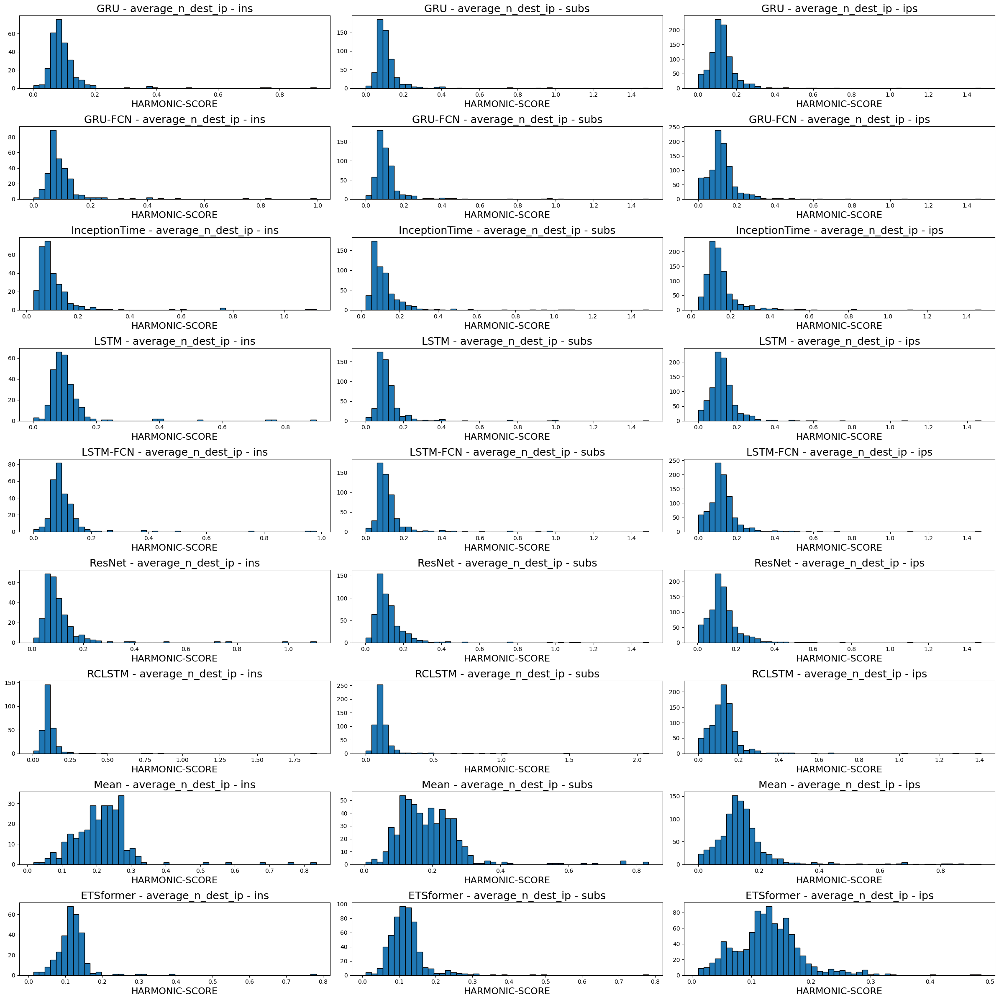

In [26]:
plot_kdes("average_n_dest_ip")

### average_n_dest_ports - Average of the number of unique destination ports

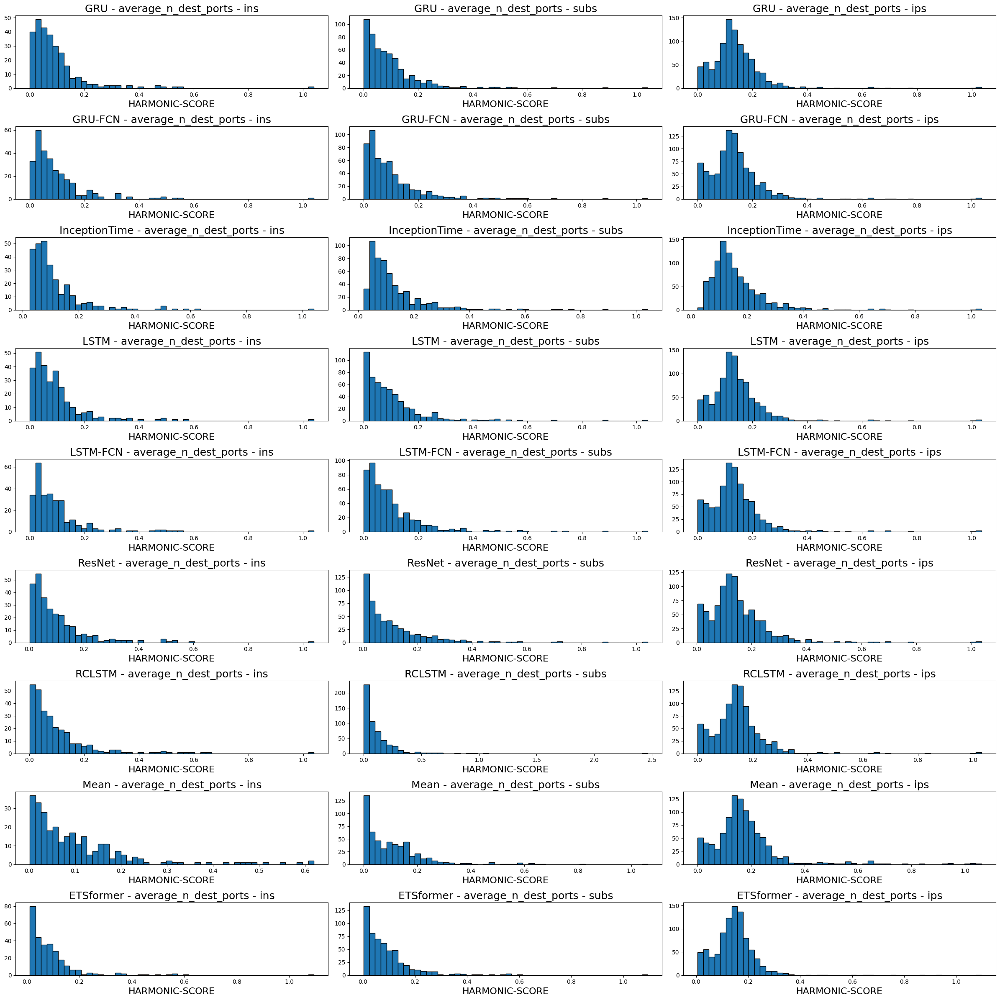

In [27]:
plot_kdes("average_n_dest_ports")

### std_n_dest_asn - Standard deviation of the number of unique destination ASNs

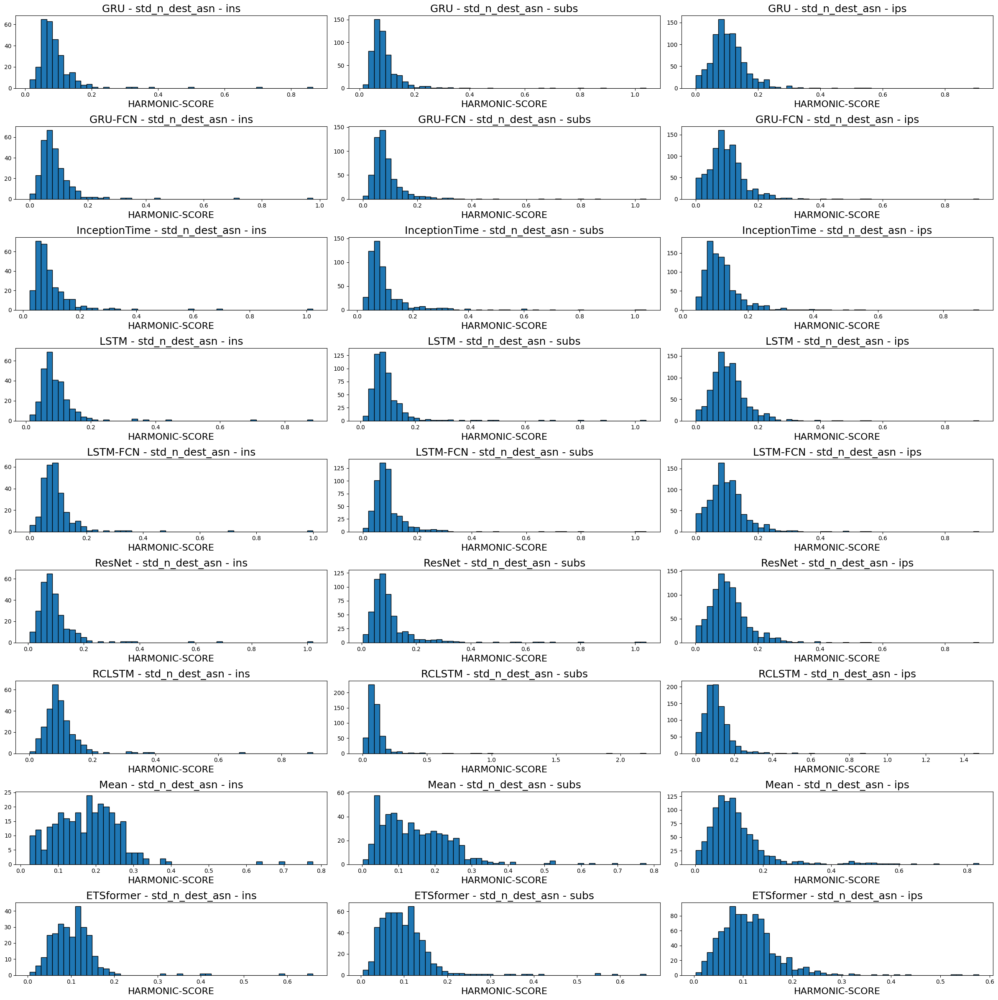

In [28]:
plot_kdes("std_n_dest_asn")

### std_n_dest_ip - Standard deviation of the number of unique destination ASNs

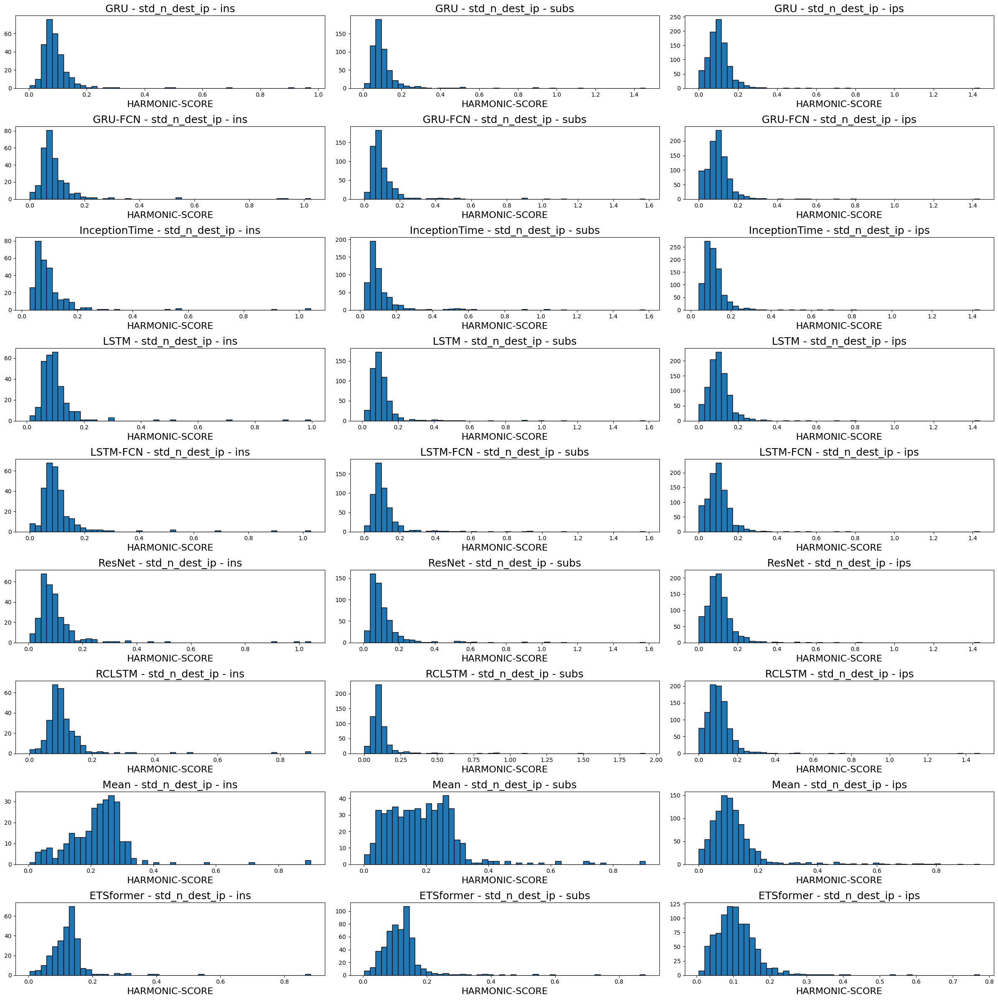

In [29]:
plot_kdes("std_n_dest_ip")

### std_n_dest_ports - Standard deviation of the number of unique destination ports

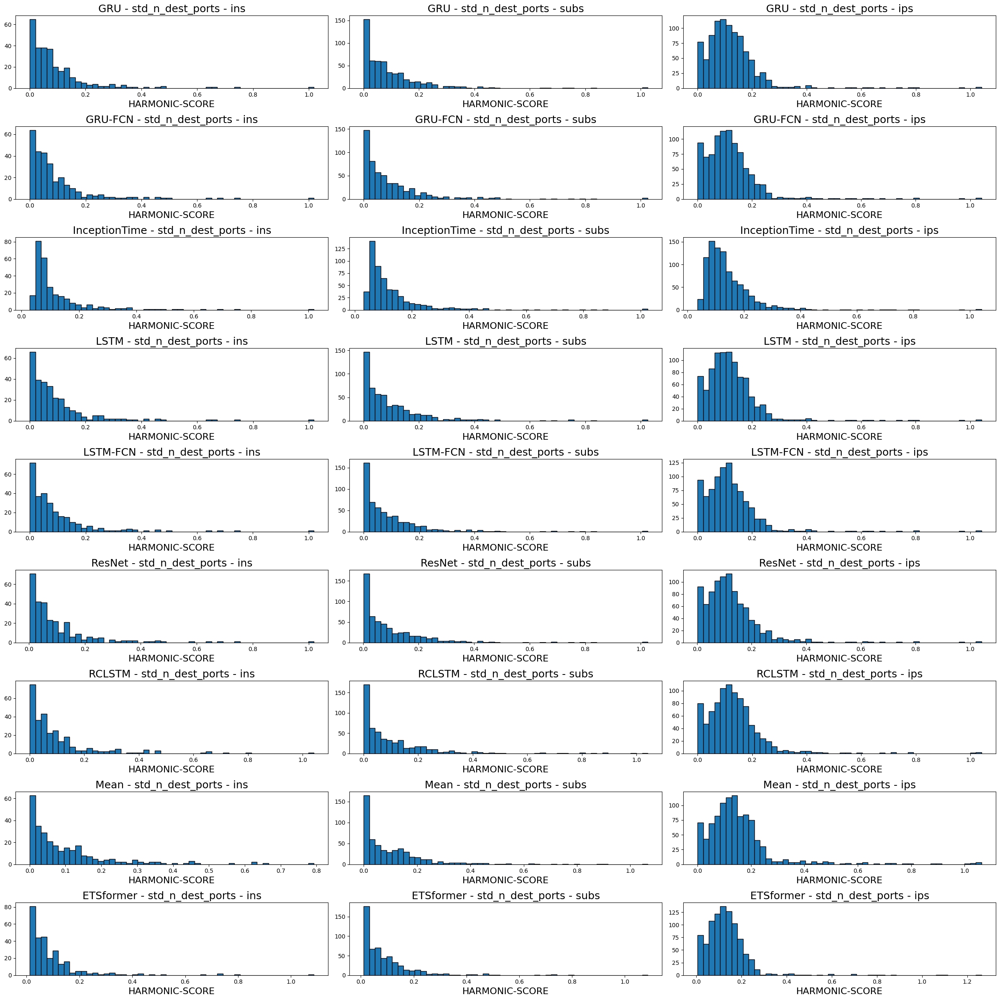

In [30]:
plot_kdes("std_n_dest_ports")

### sum_n_dest_asn - Sum of the number of unique destination ASNs

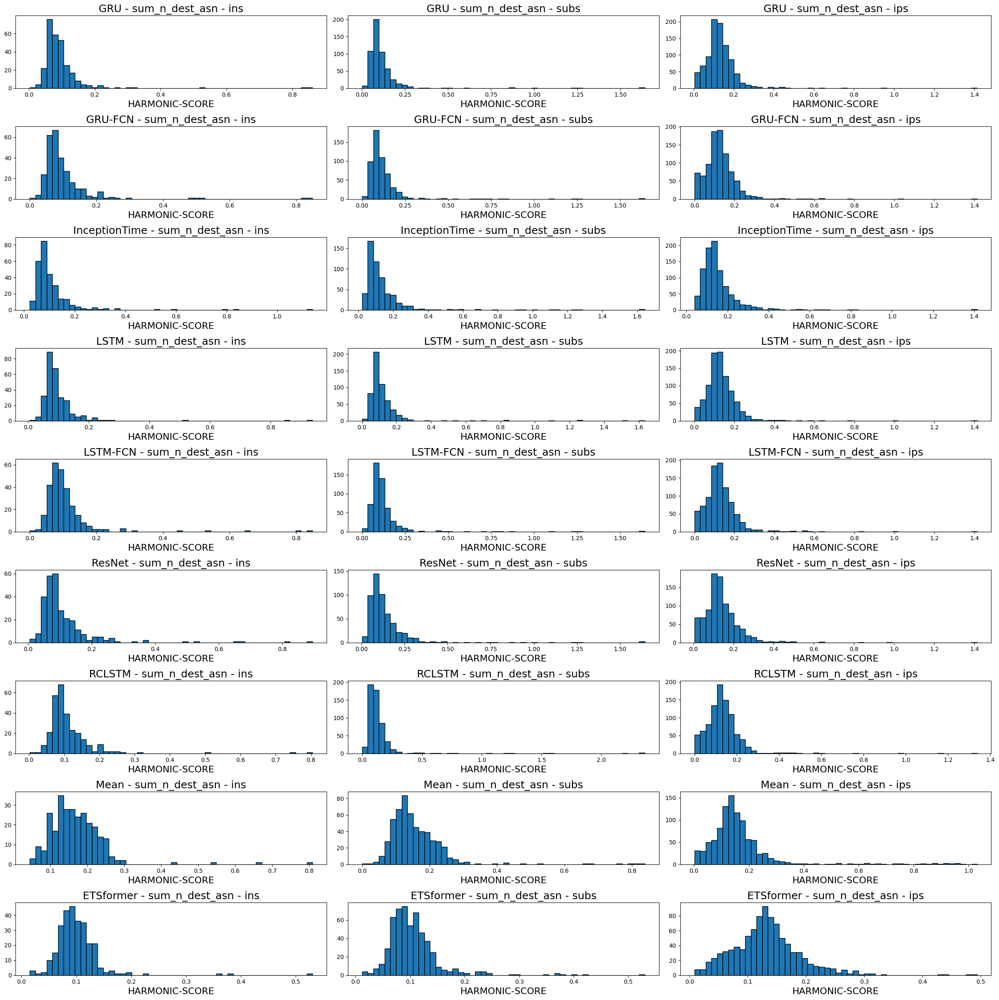

In [31]:
plot_kdes("sum_n_dest_asn")

### sum_n_dest_ip - Sum of the number of unique destination ASNs

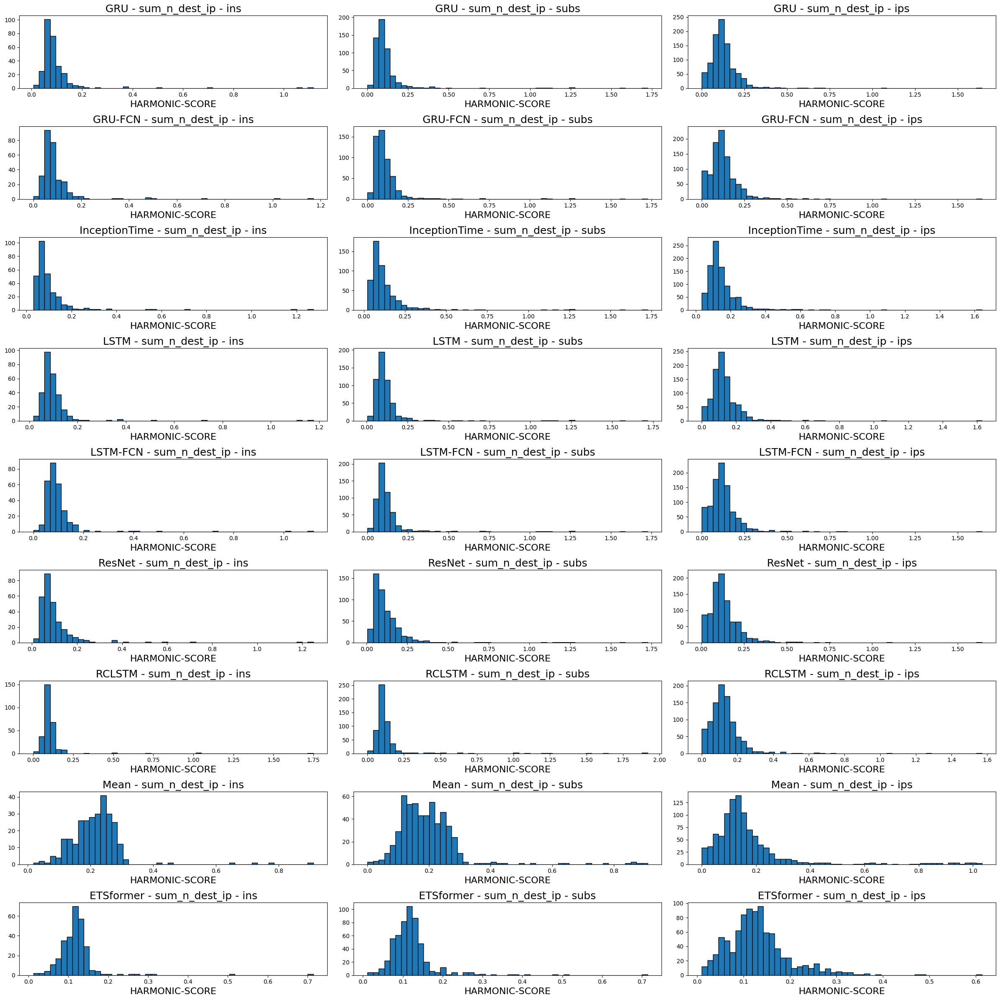

In [32]:
plot_kdes("sum_n_dest_ip")

### sum_n_dest_ports - Sum of the number of unique destination ports

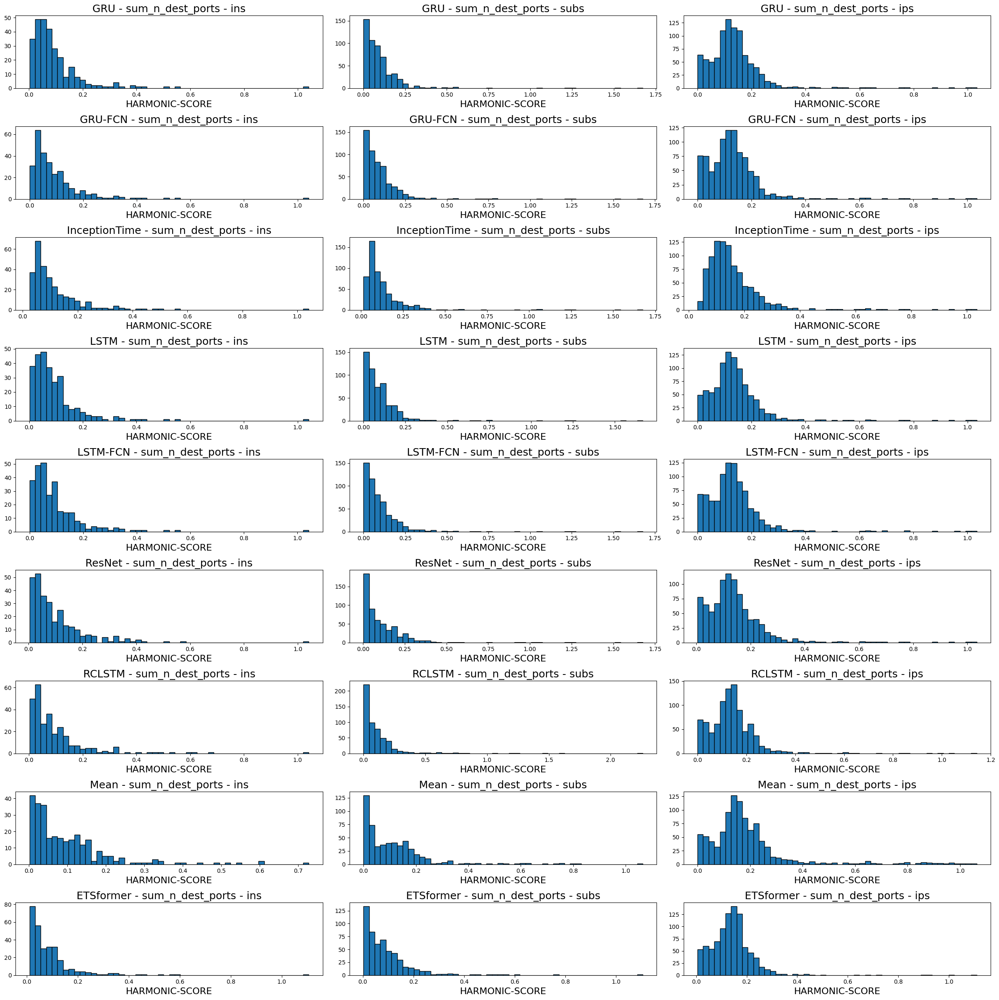

In [33]:
plot_kdes("sum_n_dest_ports")